In [1]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
import sys
import os
import glob
import numpy as np
import pandas as pd
import dask.dataframe as dd
import xarray as xr
import hvplot.xarray  # noqa
import seaborn as sns
from dask import delayed, compute
import itertools
from pytmatrix import tmatrix_aux, refractive, tmatrix, radar
from matplotlib import colors
from pymiecoated import Mie
from scipy.constants import c
from scipy import stats as ss
from scipy.optimize import minimize
from scipy.optimize import brentq
from scipy.special import gamma
from sqlalchemy.exc import OperationalError
import matplotlib.pylab as pl
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.gridspec as gridspec
from matplotlib.colors import LinearSegmentedColormap
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, AgglomerativeClustering
from re import split
import matplotlib.dates as mdates
from dask_jobqueue import SLURMCluster
from dask.distributed import Client, progress
from dask import delayed, compute
from metpy.calc import pressure_to_height_std as p2h
from metpy.calc import lcl
import cartopy.crs as ccrs
import cartopy
import cartopy.mpl.ticker as cticker
import cartopy.io.img_tiles as cimgt
import cartopy.feature as cfeature
import warnings
import cython
from dask.distributed import Client, LocalCluster

warnings.filterwarnings('ignore')


sys.path.insert(1, f"{os.path.abspath(os.path.join(os.path.abspath(''), '../'))}")
from src.utils import get_pars_from_ini, make_dir

location = split(', |_|-|!', os.popen('hostname').read())[0].replace("\n", "")
path_data = get_pars_from_ini(file_name='loc')[location]['path_data']

/data/keeling/a/alfonso8/miniconda3/envs/camp2ex_proj/lib/python3.9/site-packages/dask_jobqueue/core.py:20: FutureWarning: tmpfile is deprecated and will be removed in a future release. Please use dask.utils.tmpfile instead.
  from distributed.utils import tmpfile


In [2]:
cluster = LocalCluster()  
cluster

In [3]:
client = Client(cluster)

In [4]:
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/34134/status,
Dashboard: /proxy/34134/status,Workers: 8
Total threads: 48,Total memory: 48.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:40263,Workers: 8
Dashboard: /proxy/34134/status,Total threads: 48
Started: Just now,Total memory: 48.00 GiB
Comm: tcp://127.0.0.1:38617,Total threads: 6
Dashboard: /proxy/35866/status,Memory: 6.00 GiB
Nanny: tcp://127.0.0.1:44144,


In [5]:
# cluster = SLURMCluster(queue="seseml",
#                        memory='50GB',
#                        cores=40,
#                        processes=1,
#                        walltime='24:00:00', 
# #                        scheduler_options={
# #                            'host': '172.22.179.3:7224', 
# #                            'dashboard_address': ':7798'
# #                        }
#                       )

# cluster.scale(jobs=1)
# cluster

In [6]:
# client = Client(cluster)
# client

In [7]:
%%bash
squeue -u $USER

             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
           1725946    seseml interact alfonso8  R    2:33:04      1 keeling-j53
           1725931    seseml interact alfonso8  R    3:34:44      1 keeling-j50


In [8]:
def norm_gamma(d, nw, mu, dm):
    f_mu = (6 * (4 + mu) ** (mu + 4)) / (4 ** 4 * gamma(mu + 4) )
    slope = (4 + mu) / dm
    return nw * f_mu * (d / dm) ** mu * np.exp(-slope * d)

In [61]:
aircraft = 'Lear'
aircraft2 = 'Learjet'
aircraft1 = 'P3B'
aircraft3 = 'P3B'

In [62]:
store = f"{path_data}/cloud_probes/zarr/dm_retrieved_Lear_corr_merged.zarr"
store1 = f"{path_data}/cloud_probes/zarr/combined_psd_Lear_600_1000_5_bins_merged.zarr"
store11 = f"{path_data}/cloud_probes/zarr/combined_psd_Lear_600_1000_5_bins_merged.zarr"
store2 = f"{path_data}/cloud_probes/zarr/combined_psd_P3B_600_1000_5_bins.zarr"
store3 = f"{path_data}/cloud_probes/zarr/dm_retrieved_P3B_corr_merged.zarr"


In [63]:
dm_lear = xr.open_zarr(store)
dm_p3b = xr.open_zarr(store3)
ds_lear = xr.open_zarr(store1)
ds_lear['altitude'] = ds_lear['altitude'] * 0.3046
ds_lear = ds_lear.drop_sel(time='2019-09-09 00:54:08')
ds_p3b = xr.open_zarr(store2)

In [64]:
ds_new_lear = xr.merge([dm_lear, ds_lear], compat='override')
ds_new_p3b = xr.merge([dm_p3b, ds_p3b], compat='override')

In [65]:
new_cols = ['sigma', 'sigmap', 'dm', 'log10_nw', 'mu', 'new_mu',  'r', 'dfr', 'dbz_t_ka', 'dbz_t_ku', 'nt', 'lwc_cum', 'temp', 'vert_vel', 'altitude', "dm_true", 
            "dm_rt_dfr_nd", "dm_rt_dfr_gm_mu_3", 'log10nw_true_mu_dm', 'log10nw_true', 'log10nw_dm_nd', 'log10nw_dm_gm_mu_3', 'r_true_nw_mu_dm', 'r_dm_gm_mu_3', 
           'r_dm_nd', 'r_will', 'r_camp','r_gpm_operational', 'mu_williams', 'mu_camp','dm_williams', 'log10nw_will', 'dm_camp', 'log10nw_camp', 'lon', 'lat']

In [66]:
dm_l = ds_new_lear[new_cols]
dm_p = ds_new_p3b[new_cols]

In [67]:
ds = xr.concat([dm_l, dm_p], dim='time')
ds = ds.where(ds.lwc_cum > 0.01, drop=True)
df = ds.to_dataframe()
df.shape

(8442, 36)

In [68]:
df['logr'] = np.log10(df.r)
df['lognt'] = np.log10(df.nt)
df['loglwc'] = np.log10(df.lwc_cum)

cols = ['sigma_T', 'dm_T', 'log10_nw_T', 'logr_T', 'lognt_T', "loglwc_T"]
scaler = StandardScaler()
df[cols]= scaler.fit_transform(df[['sigma', 'dm', 'log10_nw', 'logr', 'lognt', 'loglwc']])

n_c = 6
X = df[['sigma_T', 'dm_T', 'log10_nw_T', 'logr_T', 'lognt_T', "loglwc_T"]]
kmeans = KMeans(n_clusters=n_c, random_state=10)
kmeans.fit(X)

df['kmeans_6'] = kmeans.labels_

In [69]:
df = df.reset_index()
# df.to_parquet('/data/keeling/a/alfonso8/gpm/camp2ex/cloud_probes/parquet/all_data.parquet')

In [70]:
sns.set(rc={"figure.dpi":120, 'savefig.dpi':120})

In [71]:
from matplotlib.colors import ListedColormap

# construct cmap
flatui = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
my_cmap6 = ListedColormap(sns.color_palette(flatui).as_hex())

colors6 = my_cmap6(np.linspace(0,1,n_c))

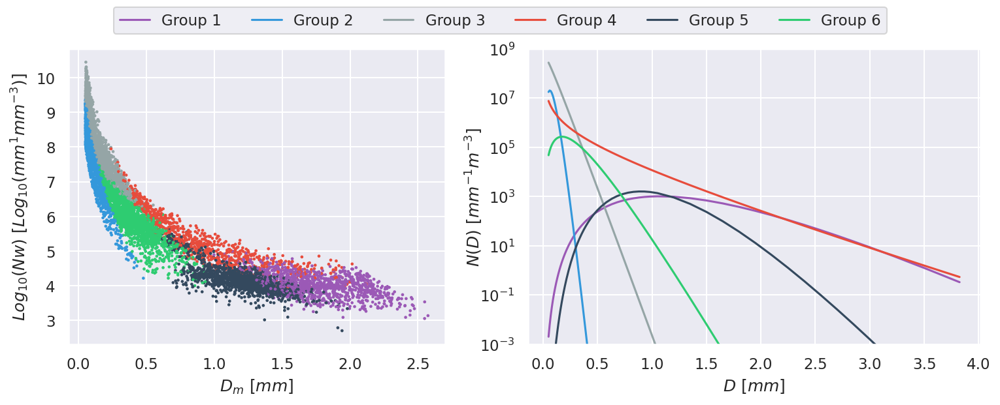

In [72]:
fig, (ax, ax1) = plt.subplots(1, 2, figsize=(12,4), dpi=150,  gridspec_kw={'width_ratios': [1, 1.2]})
sc = ax.scatter(df['dm'], df['log10_nw'], c=df['kmeans_6'], s=1.5, cmap=my_cmap6)
ax.set_xlabel("$D_m \ [mm]$")
ax.set_ylabel("$Log_{10}(Nw) \ [Log_{10}(mm^{1}mm^{-3})]$")
# fig.colorbar(sc, ax=ax, label="Group number")

ax1.set_yscale('log')
ax1.set_ylim(1e-3, 1e9)
d = ds_lear.diameter/1000
ax1.grid('both')
n = df['kmeans_6'].max() + 1
ax1.set_ylabel("$N(D) \  [mm^{-1}m^{-3}]$", labelpad=-3)
ax1.set_xlabel("$D\ [mm]$")
# colors = pl.cm.jet(np.linspace(0,1,n))
for i in range(0,n):
    df_sub = df[df['kmeans_6'] == i]
    mu = df_sub['mu'].mean()
    dm = df_sub['dm'].mean()
    nw = (10 ** (df_sub['log10_nw'])).mean()
    gm = norm_gamma(d, nw=nw, mu=mu, dm=dm)
    ax1.plot(ds_lear.diameter/1000, gm, c=colors6[i], label=f"Group {i + 1}")
# ax1.legend()

lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
fig.legend(lines, labels, loc='upper center', ncol=6)

In [73]:
def metrics(x, xpred):
    rmse = np.sqrt(np.sum((xpred - x) ** 2 / len(x)))
    mae = np.sum(np.abs(xpred - x)) / len(x) 
    corr = xr.corr(x, xpred).compute()**2.
    return rmse.compute().values, mae.compute().values, corr.values

def metrics_pd(x, xpred):
    rmse = np.sqrt(np.sum((xpred - x) ** 2 / len(x)))
    mae = np.sum(np.abs(xpred - x)) / len(x) 
    corr = np.corrcoef(x, xpred)**2.
    return rmse, mae, corr[0, 1]

def norm_gamma(d, nw, mu, dm):
    f_mu = (6 * (4 + mu) ** (mu + 4)) / (4 ** 4 * gamma(mu + 4) )
    slope = (4 + mu) / dm
    return nw * f_mu * (d / dm) ** mu * np.exp(-slope * d)

In [74]:
rmse, mae, corr1 = metrics_pd(df.dm, df.dm_rt_dfr_nd)

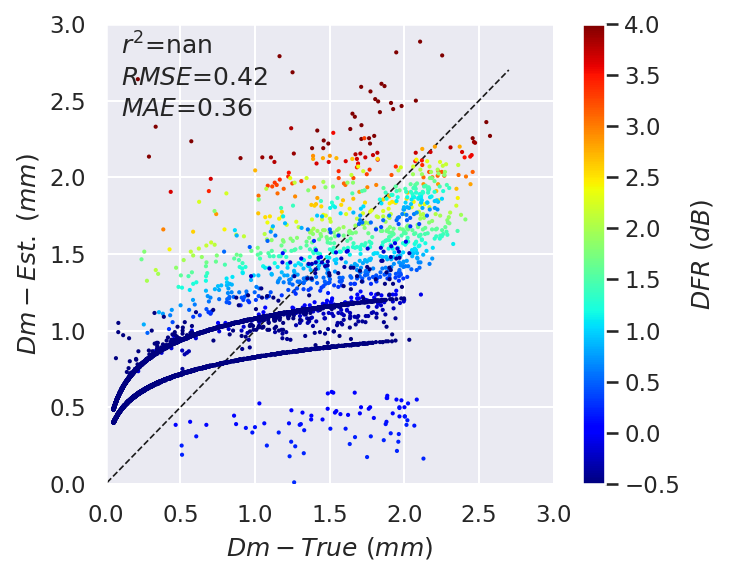

In [75]:
fig, ax1 = plt.subplots(dpi=150, figsize=(5, 4))

sc1 = ax1.scatter(df.dm, 
                  df.dm_rt_dfr_nd, 
                  s=1, zorder=10, 
                  c=df.dfr, cmap='jet', vmin=-0.5, vmax=4)

ax1.set_ylabel(r"$Dm-Est. \ (mm) $")
x = np.linspace(*ax1.get_xlim())

ax1.set_xlabel(r"$Dm-True \ (mm) $")
ax1.text(0.1, 2.8, r"$r^2$" + f"={corr1:.2f}")
ax1.text(0.1, 2.6, r"$RMSE$" + f"={rmse:.2f}")
ax1.text(0.1, 2.4, r"$MAE$" + f"={mae:.2f}")
fig.colorbar(sc1, ax=ax1, label=r'$DFR \ (dB)$')
ax1.plot(x, x, c='k', ls='--', lw=0.8)
ax1.set_xlim(0, 3)
ax1.set_ylim(0, 3)
plt.tight_layout()
plt.savefig('../results/dm_gm.jpeg')

In [76]:
rmse, mae, corr1 = metrics_pd(df.dm, df.dm_rt_dfr_gm_mu_3)

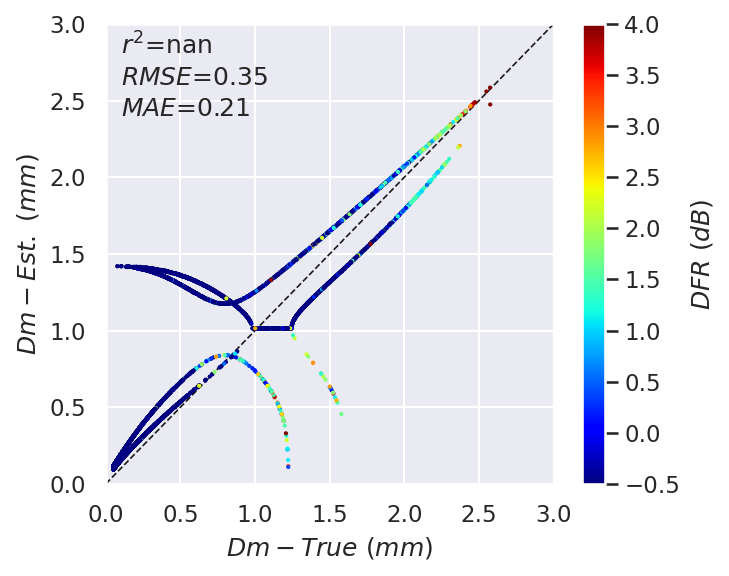

In [77]:
fig, ax = plt.subplots( dpi=150, figsize=(5, 4))
sc = ax.scatter(df.dm_true, 
                df.dm_rt_dfr_gm_mu_3, 
                c=df.dfr, cmap='jet', vmin=-0.5, vmax=4, s=1, zorder=10)
ax.set_xlim(0, 3)
ax.set_ylim(0, 3)
x = np.linspace(*ax.get_xlim())
ax.plot(x, x, c='k', ls='--', lw=0.8)
ax.text(0.1, 2.8, r"$r^2$" + f"={corr1:.2f}")
ax.text(0.1, 2.6, r"$RMSE$" + f"={rmse:.2f}")
ax.text(0.1, 2.4, r"$MAE$" + f"={mae:.2f}")
ax.set_ylabel(r"$Dm-Est. \ (mm) $")
ax.set_xlabel(r"$Dm-True \ (mm) $")
fig.colorbar(sc, ax=ax, label=r'$DFR \ (dB)$')
plt.tight_layout()
plt.savefig('../results/dm_gpm.jpeg')

In [26]:
# rmse, mae, corr1 = metrics_pd(df['log10nw_true'], df['log10nw_true_mu_dm'])
rmse, mae, corr1 = metrics_pd(df['log10_nw'], df['log10nw_true_mu_dm'])
print(rmse, mae, corr1)

inf inf nan


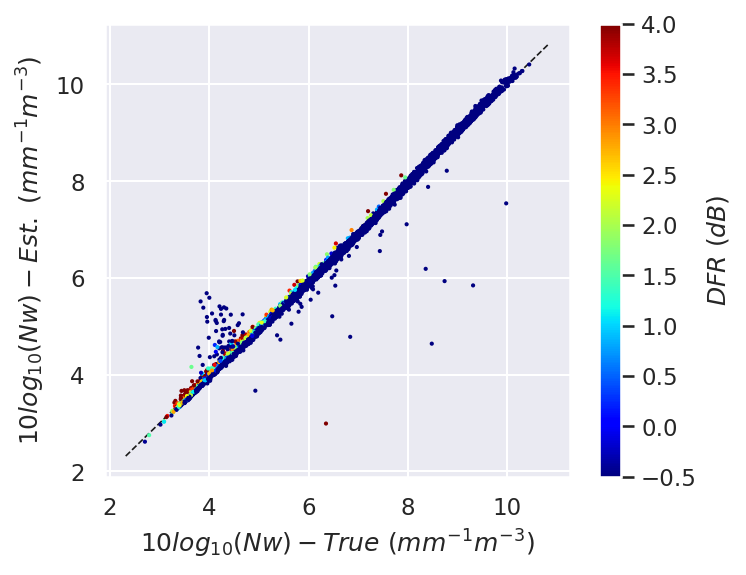

In [27]:
fig, ax = plt.subplots(figsize=(5, 4), dpi=150)
sc = ax.scatter(df.log10_nw,
                df.log10nw_true_mu_dm / 10, 
                c=df.dfr, cmap='jet', vmin=-0.5, vmax=4, s=1, zorder=10)
x = np.linspace(*ax.get_xlim())
ax.plot(x, x, c='k', ls='--', lw=0.8)
ax.set_ylabel(r"$10log_{10}(Nw)-Est. \ (mm^{-1} m^{-3}) $")
ax.set_xlabel(r"$10log_{10}(Nw)-True \ (mm^{-1} m^{-3})$")
# ax.text(25, 100, r"$r^2$" + f"={corr1:.3f}")
# ax.text(25, 94, r"$RMSE$" + f"={rmse:.2f}")
# ax.text(25, 88, r"$MAE$" + f"={mae:.2f}")
fig.colorbar(sc, ax=ax, label=r'$DFR \ (dB)$')
# plt.tight_layout()
# plt.savefig('../results/nw_gm.jpeg')

33.78089053970539 25.95146666478731 nan


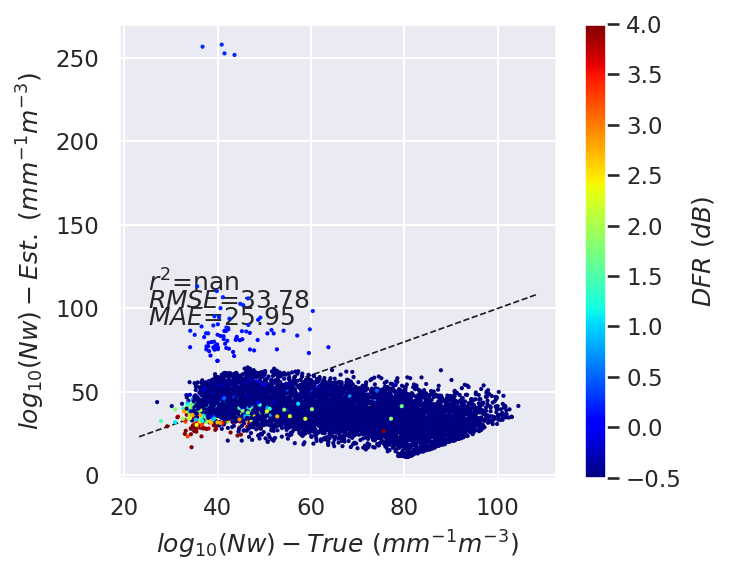

In [28]:
rmse, mae, corr1 = metrics_pd(df['log10nw_true'], df['log10nw_dm_nd'])
print(rmse, mae, corr1)

fig, ax = plt.subplots(figsize=(5, 4), dpi=150)
sc = ax.scatter(df.log10nw_true,
                df.log10nw_dm_nd, 
                c=df.dfr, cmap='jet', vmin=-0.5, vmax=4, s=1, zorder=10)
x = np.linspace(*ax.get_xlim())
ax.plot(x, x, c='k', ls='--', lw=0.8)
ax.set_ylabel(r"$log_{10}(Nw)-Est. \ (mm^{-1} m^{-3}) $")
ax.set_xlabel(r"$log_{10}(Nw)-True \ (mm^{-1} m^{-3})$")
ax.text(25, 120-10, r"$r^2$" + f"={corr1:.3f}")
ax.text(25, 120-20, r"$RMSE$" + f"={rmse:.2f}")
ax.text(25, 120-30, r"$MAE$" + f"={mae:.2f}")
fig.colorbar(sc, ax=ax, label=r'$DFR \ (dB)$')
plt.tight_layout()
plt.savefig('../results/nw_nd.jpeg')

In [29]:
rmse, mae, corr1 = metrics_pd(df['log10nw_true'], df['log10nw_dm_gm_mu_3'])
print(rmse, mae, corr1)

inf inf nan


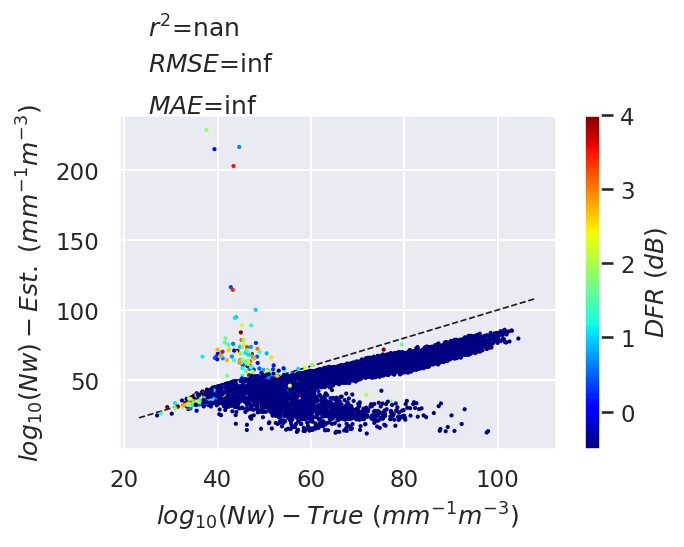

In [30]:
fig, ax = plt.subplots(figsize=(5, 4), dpi=150)
sc = ax.scatter(df.log10nw_true, 
                df.log10nw_dm_gm_mu_3,
                c=df.dfr, cmap='jet', vmin=-0.5, vmax=4, s=1, zorder=10)
x = np.linspace(*ax.get_xlim())
ax.plot(x, x, c='k', ls='--', lw=0.8)
ax.set_ylabel(r"$log_{10}(Nw)-Est. \ (mm^{-1} m^{-3}) $")
ax.set_xlabel(r"$log_{10}(Nw)-True \ (mm^{-1} m^{-3})$")
ax.text(25, 300-5, r"$r^2$" + f"={corr1:.3f}")
ax.text(25, 300-30, r"$RMSE$" + f"={rmse:.2f}")
ax.text(25, 300-60, r"$MAE$" + f"={mae:.2f}")
fig.colorbar(sc, ax=ax, label=r'$DFR \ (dB)$')
plt.tight_layout()
plt.savefig('../results/nw_gpm.jpeg')

In [31]:
rmse, mae, corr1 = metrics_pd(df['r'], df['r_true_nw_mu_dm'])
print(rmse, mae, corr1)

2.937664016723733 1.202233899972034 nan


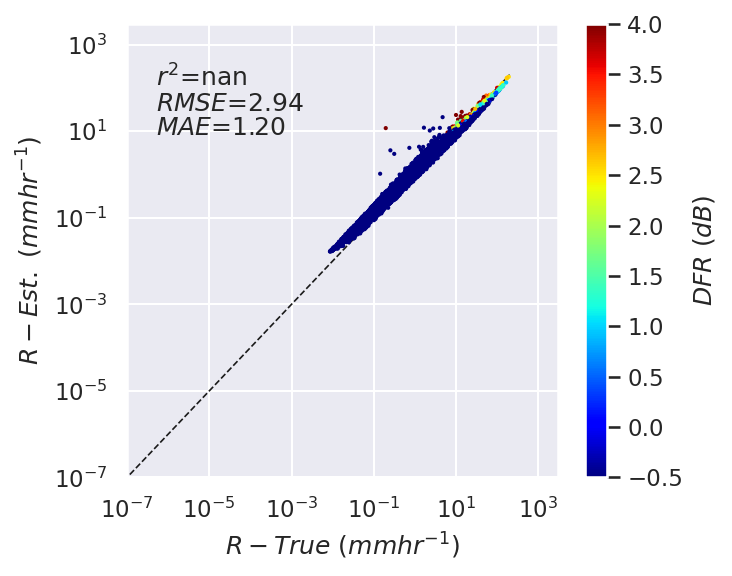

In [32]:
fig, ax = plt.subplots(figsize=(5, 4), dpi=150)
sc = ax.scatter(df.r, 
                df.r_true_nw_mu_dm, 
                c=df.dfr, cmap='jet', vmin=-0.5, vmax=4, s=1, zorder=10)
x = np.linspace(*ax.get_xlim())
ax.plot(x, x, c='k', ls='--', lw=0.8)
ax.set_ylabel(r"$R-Est. \ (mm hr^{-1}) $")
ax.set_xlabel(r"$R -True \ (mm hr^{-1})$")
ax.text(0.0000005, 105, r"$r^2$" + f"={corr1:.2f}")
ax.text(0.0000005, 30, r"$RMSE$" + f"={rmse:.2f}")
ax.text(0.0000005, 8, r"$MAE$" + f"={mae:.2f}")
ax.set_xlim(0.0000001, 3000)
ax.set_ylim(0.0000001, 3000)
fig.colorbar(sc, ax=ax, label=r'$DFR \ (dB)$')
ax.set_yscale('log')
ax.set_xscale('log')
plt.tight_layout()
plt.savefig('../results/r_gm.jpeg')

In [33]:
rmse, mae, corr1 = metrics_pd(df['r'], df['r_dm_gm_mu_3'])
print(rmse, mae, corr1)

983.3775469069615 23.58113679012476 nan


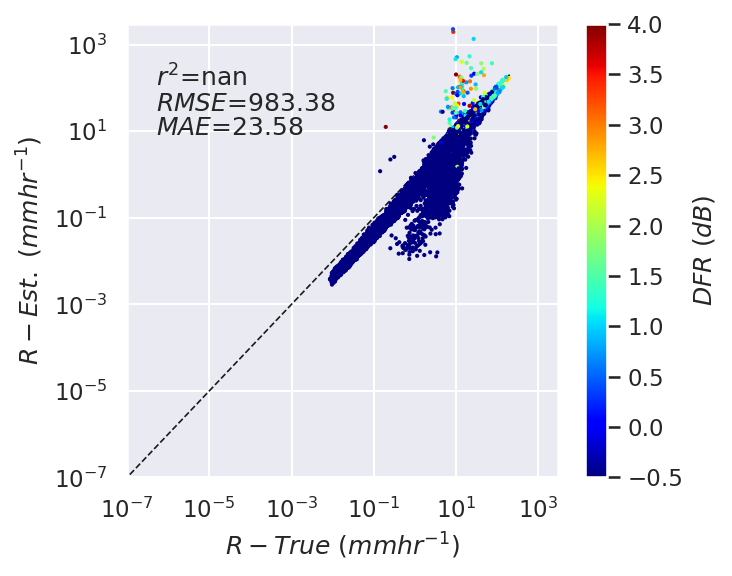

In [34]:
fig, ax1 = plt.subplots(figsize=(5, 4), dpi=150)

sc1 = ax1.scatter(df.r, 
                  df.r_dm_gm_mu_3, 
                   c=df.dfr, cmap='jet', vmin=-0.5, vmax=4, s=1, zorder=10)
# x = np.linspace(*ax1.get_xlim())
ax1.plot(x, x, c='k', ls='--', lw=0.8)
ax1.set_ylabel(r"$R-Est. \ (mm hr^{-1}) $")
ax1.set_xlabel(r"$R -True \ (mm hr^{-1})$")
ax1.text(0.0000005, 105, r"$r^2$" + f"={corr1:.2f}")
ax1.text(0.0000005, 30, r"$RMSE$" + f"={rmse:.2f}")
ax1.text(0.0000005, 8, r"$MAE$" + f"={mae:.2f}")
ax1.set_xlim(0.0000001, 3000)
ax1.set_ylim(0.0000001, 3000)
fig.colorbar(sc1, ax=ax1, label=r'$DFR \ (dB)$')
ax1.set_yscale('log')
ax1.set_xscale('log')
plt.tight_layout()
plt.savefig('../results/r_gpm.jpeg')

2275.436242760868 55.779747725770164 nan


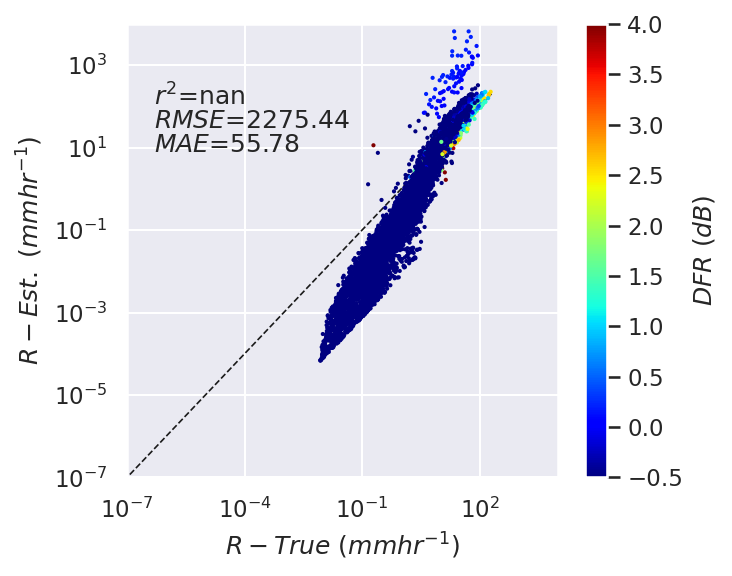

In [35]:
rmse, mae, corr1 = metrics_pd(df['r'], df['r_dm_nd'])
print(rmse, mae, corr1)

fig, ax1 = plt.subplots(figsize=(5, 4), dpi=150)

sc1 = ax1.scatter(df.r, 
                  df.r_dm_nd, 
                   c=df.dfr, cmap='jet', vmin=-0.5, vmax=4, s=1, zorder=10)
x = np.linspace(*ax1.get_xlim())
ax1.plot(x, x, c='k', ls='--', lw=0.8)
ax1.set_ylabel(r"$R-Est. \ (mm hr^{-1}) $")
ax1.set_xlabel(r"$R -True \ (mm hr^{-1})$")
ax1.text(0.0000005, 105, r"$r^2$" + f"={corr1:.2f}")
ax1.text(0.0000005, 30, r"$RMSE$" + f"={rmse:.2f}")
ax1.text(0.0000005, 8, r"$MAE$" + f"={mae:.2f}")
ax1.set_xlim(0.0000001, 10000)
ax1.set_ylim(0.0000001, 10000)
fig.colorbar(sc1, ax=ax1, label=r'$DFR \ (dB)$')
ax1.set_yscale('log')
ax1.set_xscale('log')
plt.tight_layout()
plt.savefig('../results/r_nd.jpeg')

In [36]:
x_bins = [-10, -0.5, 0.0, 0.5, 1.0, 1.5, 10]
x_bin_labels = [-10, -0.5, 0.0, 0.5, 1.0, 1.5]
title = ["DFR < -0.5", "-0.5 < DFR < 0.0", "0.0 < DFR < 0.5", "0.5 < DFR < 1.0", "1.0 < DFR < 1.5", "DFR > 1.5"]

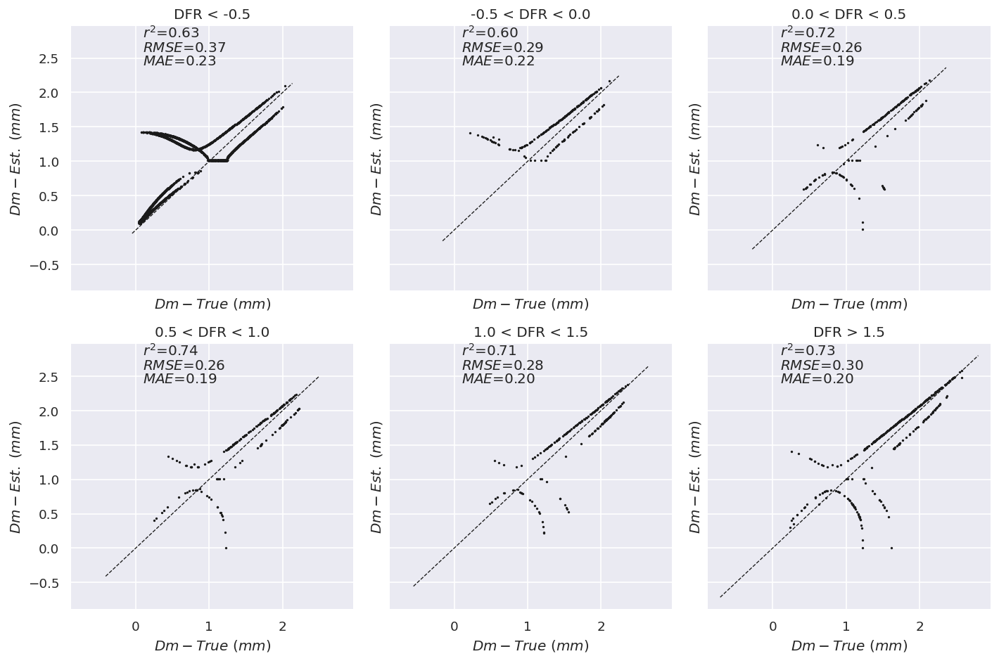

In [37]:
fig, axes = plt.subplots(2, 3, figsize=(12, 8), sharex=True, sharey=True)
grouped =  ds.groupby_bins(ds.dfr, x_bins, labels=x_bin_labels)

for i, ax in enumerate(axes.flat):
    try:
        ds1 = grouped[x_bin_labels[i]]    
        df1 = ds1[['dm_true', 'dm_rt_dfr_gm_mu_3']].to_dataframe()
        df1 = df1.replace([np.inf, -np.inf], np.nan).dropna()
        rmse, mae, corr1 = metrics_pd(df1['dm_true'], df1['dm_rt_dfr_gm_mu_3'])
        sc = ax.scatter(ds1.dm_true,
                        ds1.dm_rt_dfr_gm_mu_3, c='k', s=1)
        x = np.linspace(*ax.get_xlim())
        ax.plot(x, x, c='k', ls='--', lw=0.8)
        ax.text(0.1, 2.8, r"$r^2$" + f"={corr1:.2f}")
        ax.text(0.1, 2.6, r"$RMSE$" + f"={rmse:.2f}")
        ax.text(0.1, 2.4, r"$MAE$" + f"={mae:.2f}")
        ax.set_ylabel(r"$Dm-Est. \ (mm) $")
        ax.set_xlabel(r"$Dm-True \ (mm) $")
        ax.set_title(title[i])
        plt.tight_layout()
    except IndexError:
        continue
plt.savefig('../results/dm_gpm_bins.jpeg')

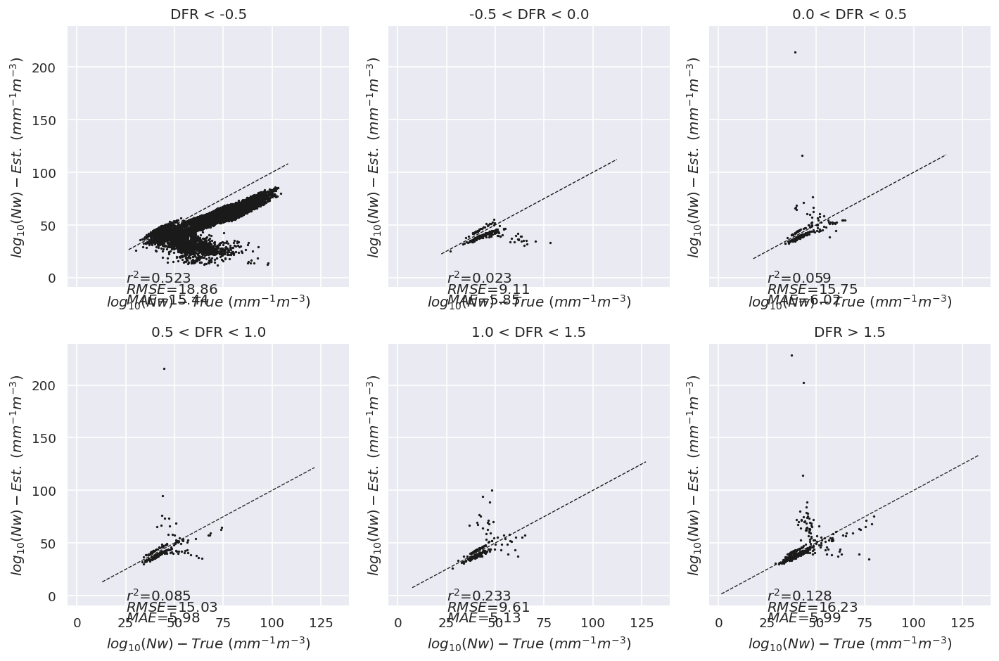

In [38]:
fig, axes = plt.subplots(2, 3, figsize=(12, 8), sharex=True, sharey=True)
grouped =  ds.groupby_bins(ds.dfr, x_bins, labels=x_bin_labels)

for i, ax in enumerate(axes.flat):
    try:
        ds1 = grouped[x_bin_labels[i]]    
        df1 = ds1[['log10nw_true', 'log10nw_dm_gm_mu_3']].to_dataframe()
        df1 = df1.replace([np.inf, -np.inf], np.nan).dropna()
        rmse, mae, corr1 = metrics_pd(df1['log10nw_true'], df1['log10nw_dm_gm_mu_3'])
        sc = ax.scatter(ds1.log10nw_true, 
                        ds1.log10nw_dm_gm_mu_3, c='k', s=1)
        x = np.linspace(*ax.get_xlim())
        ax.plot(x, x, c='k', ls='--', lw=0.8)
        ax.set_ylabel(r"$log_{10}(Nw)-Est. \ (mm^{-1} m^{-3}) $")
        ax.set_xlabel(r"$log_{10}(Nw)-True \ (mm^{-1} m^{-3})$")
        ax.text(25, -5, r"$r^2$" + f"={corr1:.3f}")
        ax.text(25, -15, r"$RMSE$" + f"={rmse:.2f}")
        ax.text(25, -25, r"$MAE$" + f"={mae:.2f}")
        ax.set_title(title[i])
        plt.tight_layout()
    except IndexError:
        continue
plt.savefig('../results/nw_gpm_bins.jpeg')

100.35834708367919 8.110473472727758 nan


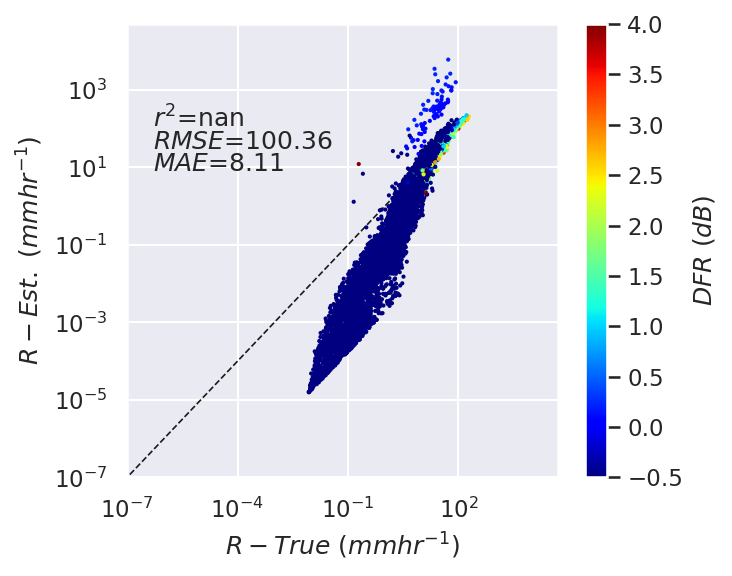

In [39]:
rmse, mae, corr1 = metrics_pd(df['r'], df['r_will'])
print(rmse, mae, corr1)

fig, ax1 = plt.subplots(figsize=(5, 4), dpi=150)

sc1 = ax1.scatter(df.r, 
                  df.r_will, 
                   c=df.dfr, cmap='jet', vmin=-0.5, vmax=4, s=1, zorder=10)
x = np.linspace(*ax1.get_xlim())
ax1.plot(x, x, c='k', ls='--', lw=0.8)
ax1.set_ylabel(r"$R-Est. \ (mm hr^{-1}) $")
ax1.set_xlabel(r"$R -True \ (mm hr^{-1})$")
ax1.text(0.0000005, 105, r"$r^2$" + f"={corr1:.2f}")
ax1.text(0.0000005, 30, r"$RMSE$" + f"={rmse:.2f}")
ax1.text(0.0000005, 8, r"$MAE$" + f"={mae:.2f}")
ax1.set_xlim(0.0000001, 50000)
ax1.set_ylim(0.0000001, 50000)
fig.colorbar(sc1, ax=ax1, label=r'$DFR \ (dB)$')
ax1.set_yscale('log')
ax1.set_xscale('log')
plt.tight_layout()
plt.savefig('../results/r_will.jpeg')

1326.3134506470915 41.56750241593672 nan


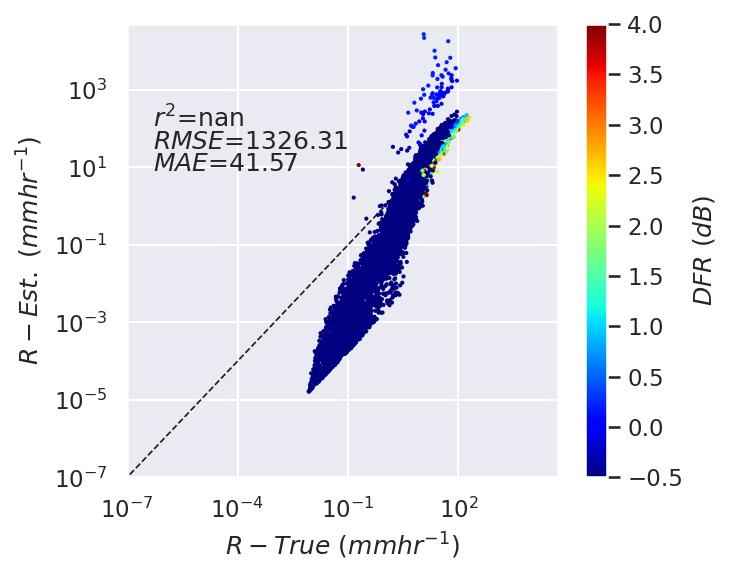

In [40]:
rmse, mae, corr1 = metrics_pd(df['r'], df['r_camp'])
print(rmse, mae, corr1)

fig, ax1 = plt.subplots(figsize=(5, 4), dpi=150)

sc1 = ax1.scatter(df.r, 
                  df.r_camp, 
                   c=df.dfr, cmap='jet', vmin=-0.5, vmax=4, s=1, zorder=10)
ax1.plot(x, x, c='k', ls='--', lw=0.8)
ax1.set_ylabel(r"$R-Est. \ (mm hr^{-1}) $")
ax1.set_xlabel(r"$R -True \ (mm hr^{-1})$")
ax1.text(0.0000005, 105, r"$r^2$" + f"={corr1:.2f}")
ax1.text(0.0000005, 30, r"$RMSE$" + f"={rmse:.2f}")
ax1.text(0.0000005, 8, r"$MAE$" + f"={mae:.2f}")
ax1.set_xlim(0.0000001, 50000)
ax1.set_ylim(0.0000001, 50000)
x = np.linspace(*ax1.get_xlim())
fig.colorbar(sc1, ax=ax1, label=r'$DFR \ (dB)$')
ax1.set_yscale('log')
ax1.set_xscale('log')
plt.tight_layout()
plt.savefig('../results/r_camp.jpeg')

14.385083964337628 5.430195339588674 nan


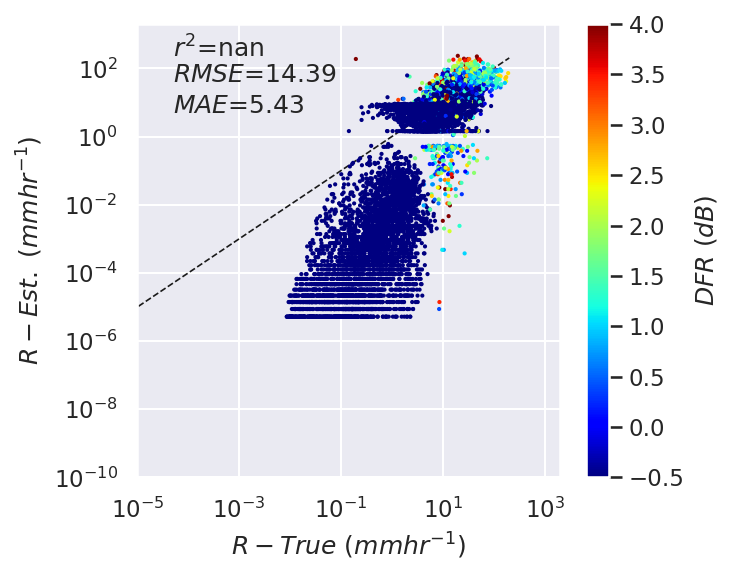

In [41]:
rmse, mae, corr1 = metrics_pd(df['r'], df['r_gpm_operational'])
print(rmse, mae, corr1)

fig, ax1 = plt.subplots(figsize=(5, 4), dpi=150)

sc1 = ax1.scatter(df.r, 
                  df.r_gpm_operational, 
                   c=df.dfr, cmap='jet', vmin=-0.5, vmax=4, s=1, zorder=10)
x = np.linspace(*ax1.get_xlim())
ax1.plot(x, x, c='k', ls='--', lw=0.8)
ax1.set_ylabel(r"$R-Est. \ (mm hr^{-1}) $")
ax1.set_xlabel(r"$R -True \ (mm hr^{-1})$")
ax1.text(0.00005, 200, r"$r^2$" + f"={corr1:.2f}")
ax1.text(0.00005, 40, r"$RMSE$" + f"={rmse:.2f}")
ax1.text(0.00005, 5, r"$MAE$" + f"={mae:.2f}")
ax1.set_xlim(0.00001, 2000)
ax1.set_ylim(0.0000000001, 2000)
fig.colorbar(sc1, ax=ax1, label=r'$DFR \ (dB)$')
ax1.set_yscale('log')
ax1.set_xscale('log')
plt.tight_layout()
plt.savefig('../results/r_operational.jpeg')

In [42]:
n_c = 6
flatui = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
my_cmap6 = ListedColormap(sns.color_palette(flatui).as_hex())
colors6 = my_cmap6(np.linspace(0,1,n_c))

In [43]:
br = np.arange(0.5, 5.5, 0.001)
# _res = np.zeros_like(br)
res = np.zeros_like(br)
for i in range(br.shape[0]):
    res[i] = np.corrcoef(df['dm'], df['sigma'] / df['dm'] ** br[i])[0, 1] ** 2
bm = br[np.argmin(res)]

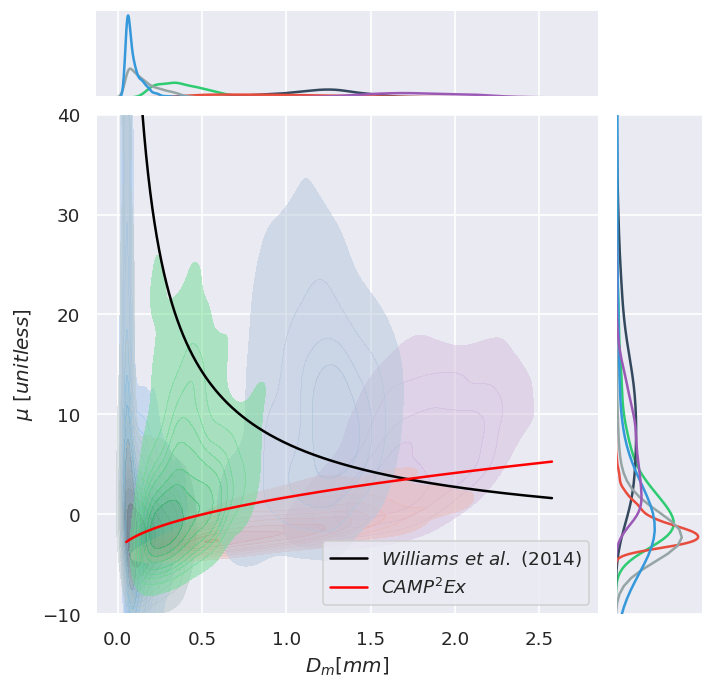

In [44]:
labels = ['1', '2', '3', '4', '5', '6']
df['mu_dm'] = 11.1 * df['dm'] ** (-0.72) - 4
df['mu_camp2ex'] = ((df['dm'] ** (2 - 2 * bm)) / (df['sigmap'].mean() ** 2)) - 4
p = sns.jointplot(data=df.rename(columns={"kmeans_6": "Group"}).replace({i: i + 1 for i in df.rename(columns={"kmeans_6": "Group"})['Group'].unique()}), 
                  x="dm", y="mu", kind="kde", hue="Group", palette=sns.color_palette(flatui).as_hex(), 
                  shade=True, alpha=.5, legend='auto')
p.fig.subplots_adjust(top=0.95)
p.set_axis_labels(r"${D_m [mm]}$", r"${\mu \  [unitless]}$",)
p.ax_marg_y.set_ylim(-10, 40)
ln = sns.lineplot(data=df, x='dm', y='mu_dm',color='black', ax=p.ax_joint, label=r"$Williams \ et \ al. \ (2014)$", legend='full')
ln2 = sns.lineplot(data=df, x='dm', y='mu_camp2ex',color='red', ax=p.ax_joint, label=r"$CAMP^{2}Ex$")
sns.move_legend(ln, 'lower right')
# p._legend.remove()
ax = plt.gca()
plt.show()

1326.3134506470915 41.56750241593672 nan


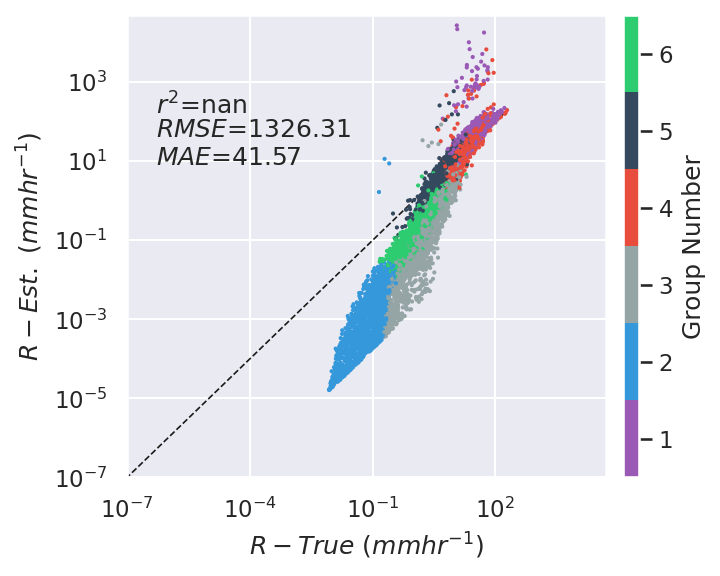

In [45]:
rmse, mae, corr1 = metrics_pd(df['r'], df['r_camp'])
print(rmse, mae, corr1)

fig, ax1 = plt.subplots(figsize=(5, 4), dpi=150)

sc1 = ax1.scatter(df.r, 
                  df.r_camp, 
                  c=df.kmeans_6, cmap=my_cmap6,  s=1, zorder=10)
ax1.plot(x, x, c='k', ls='--', lw=0.8)
ax1.set_ylabel(r"$R-Est. \ (mm hr^{-1}) $")
ax1.set_xlabel(r"$R -True \ (mm hr^{-1})$")
ax1.text(0.0000005, 155, r"$r^2$" + f"={corr1:.2f}")
ax1.text(0.0000005, 40, r"$RMSE$" + f"={rmse:.2f}")
ax1.text(0.0000005, 8, r"$MAE$" + f"={mae:.2f}")
ax1.set_xlim(0.0000001, 50000)
ax1.set_ylim(0.0000001, 50000)
x = np.linspace(*ax1.get_xlim())
ax1.set_yscale('log')
ax1.set_xscale('log')

cbar = fig.colorbar(sc1, ax=ax1, aspect=30, pad=0.03, label='Group Number')
tick_locs = (np.arange(n_c) + 0.5) * (n_c - 1) / n_c
cbar.set_ticks(tick_locs)
cbar.set_ticklabels(np.arange(1, n_c+1))
plt.tight_layout()
plt.savefig('../results/r_camp_cluster.jpeg')

100.35834708367919 8.110473472727758 nan


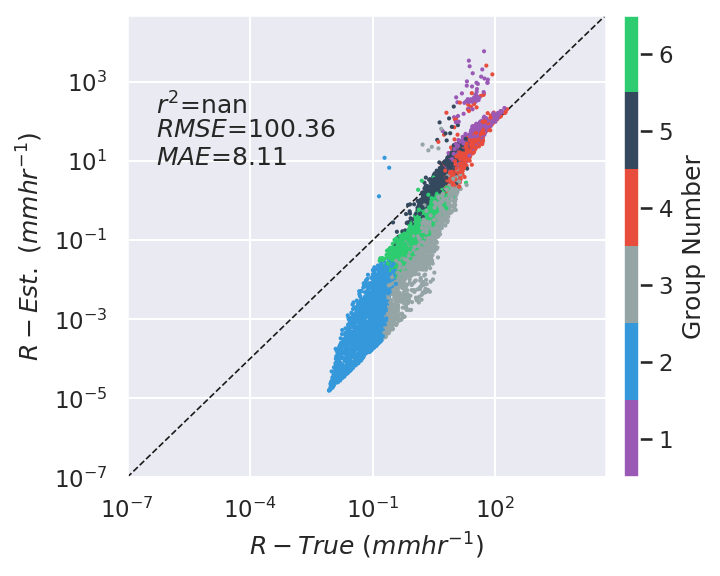

In [46]:
rmse, mae, corr1 = metrics_pd(df['r'], df['r_will'])
print(rmse, mae, corr1)

fig, ax1 = plt.subplots(figsize=(5, 4), dpi=150)

sc1 = ax1.scatter(df.r, 
                  df.r_will, 
                  c=df.kmeans_6, cmap=my_cmap6,  s=1, zorder=10)
ax1.plot(x, x, c='k', ls='--', lw=0.8)
ax1.set_ylabel(r"$R-Est. \ (mm hr^{-1}) $")
ax1.set_xlabel(r"$R -True \ (mm hr^{-1})$")
ax1.text(0.0000005, 155, r"$r^2$" + f"={corr1:.2f}")
ax1.text(0.0000005, 40, r"$RMSE$" + f"={rmse:.2f}")
ax1.text(0.0000005, 8, r"$MAE$" + f"={mae:.2f}")
ax1.set_xlim(0.0000001, 50000)
ax1.set_ylim(0.0000001, 50000)
x = np.linspace(*ax1.get_xlim())
ax1.set_yscale('log')
ax1.set_xscale('log')

cbar = fig.colorbar(sc1, ax=ax1, aspect=30, pad=0.03, label='Group Number')
tick_locs = (np.arange(n_c) + 0.5) * (n_c - 1) / n_c
cbar.set_ticks(tick_locs)
cbar.set_ticklabels(np.arange(1, n_c+1))
plt.tight_layout()
plt.savefig('../results/r_will_cluster.jpeg')

983.3775469069615 23.58113679012476 nan


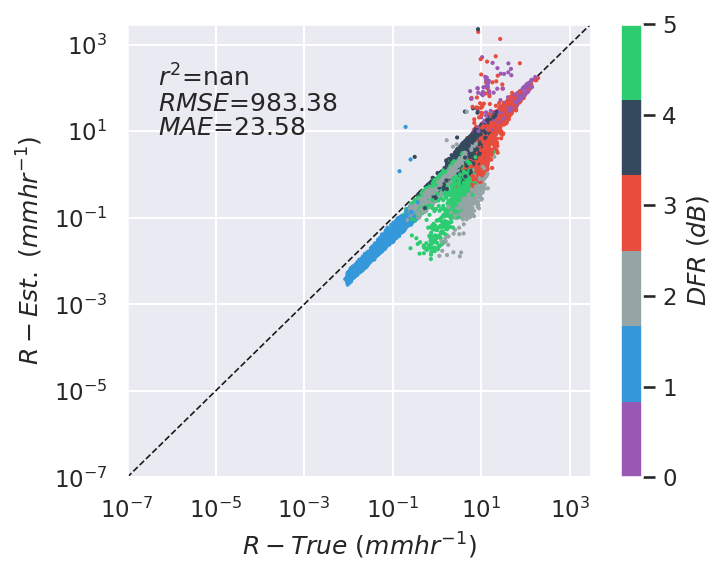

In [47]:

rmse, mae, corr1 = metrics_pd(df['r'], df['r_dm_gm_mu_3'])
print(rmse, mae, corr1)
fig, ax1 = plt.subplots(figsize=(5, 4), dpi=150)

sc1 = ax1.scatter(df.r, 
                  df.r_dm_gm_mu_3, 
                   c=df.kmeans_6, cmap=my_cmap6,  s=1, zorder=10)
# x = np.linspace(*ax1.get_xlim())
ax1.plot(x, x, c='k', ls='--', lw=0.8)
ax1.set_ylabel(r"$R-Est. \ (mm hr^{-1}) $")
ax1.set_xlabel(r"$R -True \ (mm hr^{-1})$")
ax1.text(0.0000005, 105, r"$r^2$" + f"={corr1:.2f}")
ax1.text(0.0000005, 30, r"$RMSE$" + f"={rmse:.2f}")
ax1.text(0.0000005, 8, r"$MAE$" + f"={mae:.2f}")
ax1.set_xlim(0.0000001, 3000)
ax1.set_ylim(0.0000001, 3000)
fig.colorbar(sc1, ax=ax1, label=r'$DFR \ (dB)$')
ax1.set_yscale('log')
ax1.set_xscale('log')
plt.tight_layout()
plt.savefig('../results/r_gpm.jpeg')

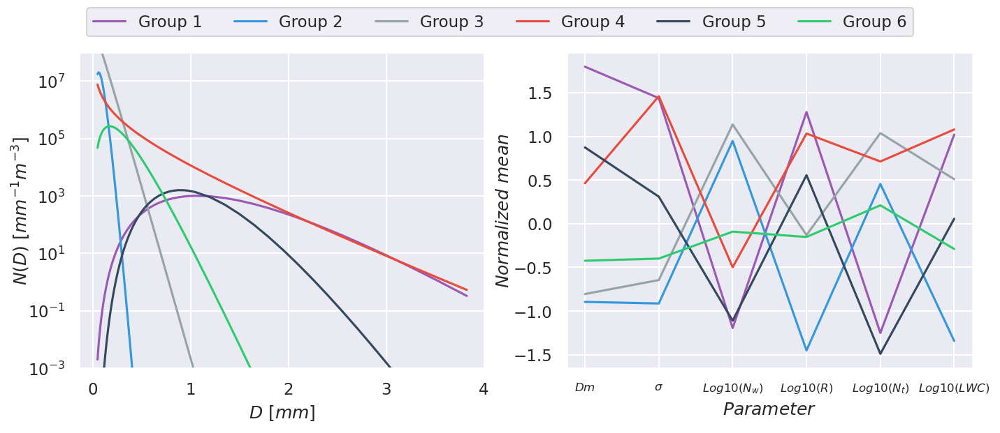

In [48]:
fig, (ax1, ax) = plt.subplots(1, 2, figsize=(11,4), dpi=150)

ax1.set_yscale('log')
ax1.set_ylim(1e-3, 1e8)
d = ds_lear.diameter/1000
ax1.grid('both')
n = df['kmeans_6'].max() + 1
ax1.set_ylabel("$N(D) \  [mm^{-1}m^{-3}]$", labelpad=-3)
ax1.set_xlabel("$D\ [mm]$")
# colors = pl.cm.jet(np.linspace(0,1,n))
dm_t, sigma_t, nw_t, r_t, nt_t, lwc_t, group = [], [], [], [], [], [], []
for i in range(0,n):
    df_sub = df[df['kmeans_6'] == i]
    mu = df_sub['mu'].mean()
    dm = df_sub['dm'].mean()
    nw = (10 ** df_sub['log10_nw']).mean()
    gm = norm_gamma(d, nw=nw, mu=mu, dm=dm)
    dm_t.append(df_sub['dm_T'].mean())
    sigma_t.append(df_sub['sigma_T'].mean())
    nw_t.append(df_sub['log10_nw_T'].mean())
    r_t.append(df_sub['logr_T'].mean())
    nt_t.append(df_sub['lognt_T'].mean())
    lwc_t.append(df_sub['loglwc_T'].mean())
    group.append(i+1)
    ax1.plot(ds_lear.diameter/1000, gm, c=colors6[i], label=f"Group {i + 1}")
# ax1.legend()

lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
fig.legend(lines, labels, loc='upper center', ncol=6)

df_t = pd.DataFrame(data=np.squeeze(np.dstack([dm_t, sigma_t, nw_t, r_t, nt_t, lwc_t, group])), index=[f"Group {i}" for i in range(1, 7)], 
                   columns=['Dm', 'sigma', 'Log10(Nw)', 'Log10(R)', "Log10(Nt)", "Log10(LWC)", "Group"]).T
for idx, i in enumerate(df_t.columns):
    ax.plot(df_t[i][:-1], c=colors6[idx] )
ticks = ax.get_xticks(minor=False)
ax.set_ylabel("$Normalized \ mean$", labelpad=1)
ax.set_xlabel("$Parameter$")
_ = ax.set_xticklabels([r'$Dm$', '$\sigma$', '$Log10(N_w)$', '$Log10(R)$', "$Log10(N_t)$", "$Log10(LWC)$", ], size=8)

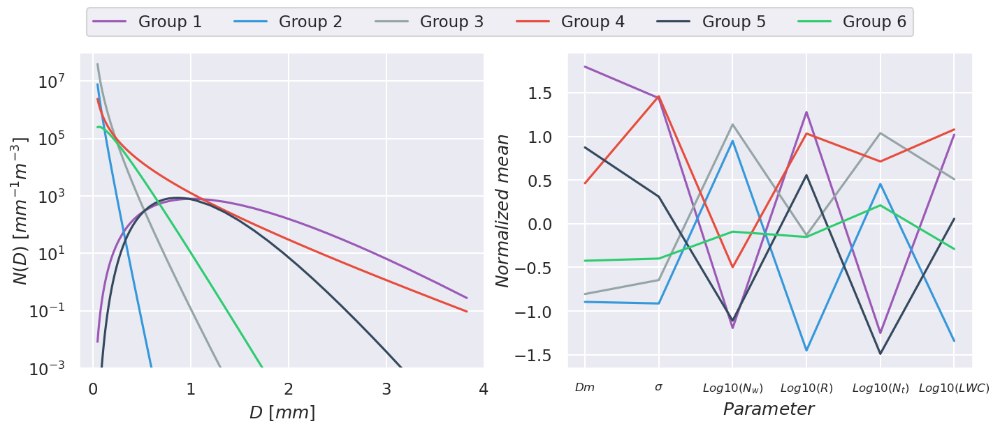

In [49]:
fig, (ax1, ax) = plt.subplots(1, 2, figsize=(11,4), dpi=150)

ax1.set_yscale('log')
ax1.set_ylim(1e-3, 1e8)
d = ds_lear.diameter/1000
ax1.grid('both')
n = df['kmeans_6'].max() + 1
ax1.set_ylabel("$N(D) \  [mm^{-1}m^{-3}]$", labelpad=-3)
ax1.set_xlabel("$D\ [mm]$")
# colors = pl.cm.jet(np.linspace(0,1,n))
dm_t, sigma_t, nw_t, r_t, nt_t, lwc_t, group = [], [], [], [], [], [], []
for i in range(0,n):
    df_sub = df[df['kmeans_6'] == i]
    mu = df_sub['mu'].quantile(0.5)
    dm = df_sub['dm'].quantile(0.5)
    nw = (10 ** df_sub['log10_nw']).quantile(0.5)
    gm = norm_gamma(d, nw=nw, mu=mu, dm=dm)
    dm_t.append(df_sub['dm_T'].mean())
    sigma_t.append(df_sub['sigma_T'].mean())
    nw_t.append(df_sub['log10_nw_T'].mean())
    r_t.append(df_sub['logr_T'].mean())
    nt_t.append(df_sub['lognt_T'].mean())
    lwc_t.append(df_sub['loglwc_T'].mean())
    group.append(i+1)
    ax1.plot(ds_lear.diameter/1000, gm, c=colors6[i], label=f"Group {i + 1}")
# ax1.legend()

lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
fig.legend(lines, labels, loc='upper center', ncol=6)

df_t = pd.DataFrame(data=np.squeeze(np.dstack([dm_t, sigma_t, nw_t, r_t, nt_t, lwc_t, group])), index=[f"Group {i}" for i in range(1, 7)], 
                   columns=['Dm', 'sigma', 'Log10(Nw)', 'Log10(R)', "Log10(Nt)", "Log10(LWC)", "Group"]).T
for idx, i in enumerate(df_t.columns):
    ax.plot(df_t[i][:-1], c=colors6[idx] )
ticks = ax.get_xticks(minor=False)
ax.set_ylabel("$Normalized \ mean$", labelpad=1)
ax.set_xlabel("$Parameter$")
_ = ax.set_xticklabels([r'$Dm$', '$\sigma$', '$Log10(N_w)$', '$Log10(R)$', "$Log10(N_t)$", "$Log10(LWC)$", ], size=8)

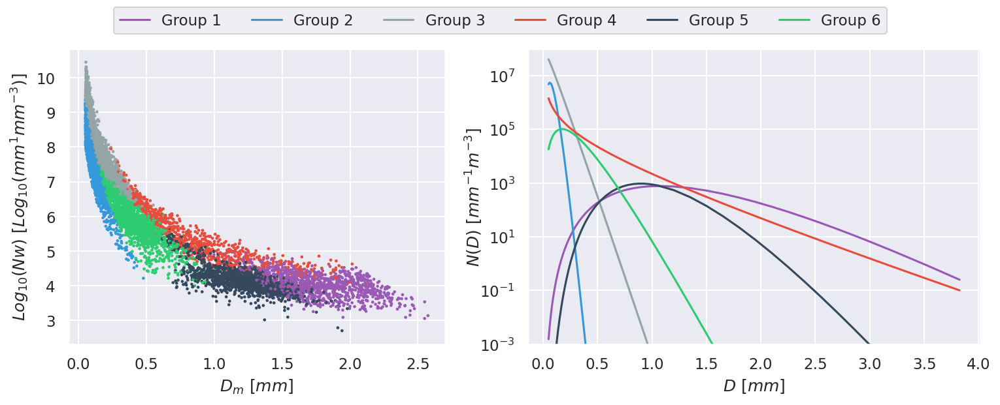

In [50]:
fig, (ax, ax1) = plt.subplots(1, 2, figsize=(12,4), dpi=150,  gridspec_kw={'width_ratios': [1, 1.2]})
sc = ax.scatter(df['dm'], df['log10_nw'], c=df['kmeans_6'], s=1.5, cmap=my_cmap6)
ax.set_xlabel("$D_m \ [mm]$")
ax.set_ylabel("$Log_{10}(Nw) \ [Log_{10}(mm^{1}mm^{-3})]$")
# fig.colorbar(sc, ax=ax, label="Group number")

ax1.set_yscale('log')
ax1.set_ylim(1e-3, 1e8)
d = ds_lear.diameter/1000
ax1.grid('both')
n = df['kmeans_6'].max() + 1
ax1.set_ylabel("$N(D) \  [mm^{-1}m^{-3}]$", labelpad=-3)
ax1.set_xlabel("$D\ [mm]$")
# colors = pl.cm.jet(np.linspace(0,1,n))
for i in range(0,n):
    df_sub = df[df['kmeans_6'] == i]
    mu = df_sub['mu'].mean()
    dm = df_sub['dm'].mean()
    nw = 10 ** (df_sub['log10_nw'].mean())
    gm = norm_gamma(d, nw=nw, mu=mu, dm=dm)
    ax1.plot(ds_lear.diameter/1000, gm, c=colors6[i], label=f"Group {i + 1}")
# ax1.legend()

lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
fig.legend(lines, labels, loc='upper center', ncol=6)

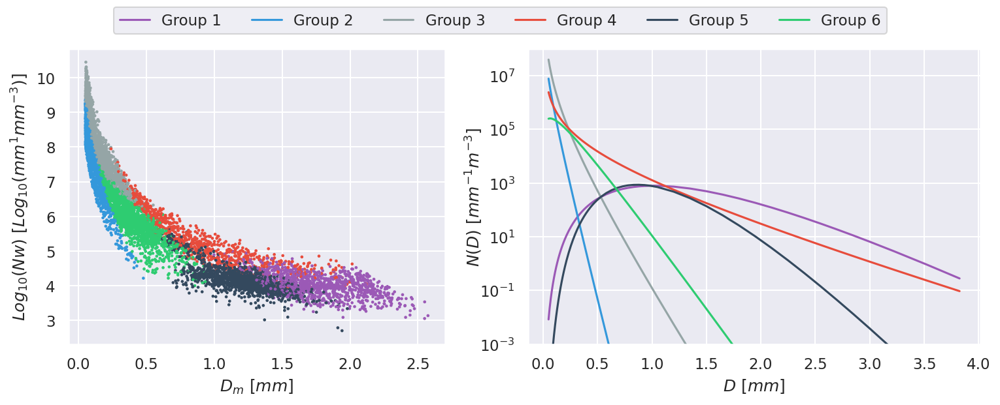

In [51]:
fig, (ax, ax1) = plt.subplots(1, 2, figsize=(12,4), dpi=150,  gridspec_kw={'width_ratios': [1, 1.2]})
sc = ax.scatter(df['dm'], df['log10_nw'], c=df['kmeans_6'], s=1.5, cmap=my_cmap6)
ax.set_xlabel("$D_m \ [mm]$")
ax.set_ylabel("$Log_{10}(Nw) \ [Log_{10}(mm^{1}mm^{-3})]$")
# fig.colorbar(sc, ax=ax, label="Group number")

ax1.set_yscale('log')
ax1.set_ylim(1e-3, 1e8)
d = ds_lear.diameter/1000
ax1.grid('both')
n = df['kmeans_6'].max() + 1
ax1.set_ylabel("$N(D) \  [mm^{-1}m^{-3}]$", labelpad=-3)
ax1.set_xlabel("$D\ [mm]$")
# colors = pl.cm.jet(np.linspace(0,1,n))
for i in range(0,n):
    df_sub = df[df['kmeans_6'] == i]
    mu = df_sub['mu'].quantile(0.5)
    dm = df_sub['dm'].quantile(0.5)
    nw = (10 ** df_sub['log10_nw']).quantile(0.5)
    gm = norm_gamma(d, nw=nw, mu=mu, dm=dm)
    ax1.plot(ds_lear.diameter/1000, gm, c=colors6[i], label=f"Group {i + 1}")
# ax1.legend()

lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
fig.legend(lines, labels, loc='upper center', ncol=6)

In [52]:
df['bringi'] = -1.6 * df['dm'] + 6.3

14.385083964337628 5.430195339588674 nan


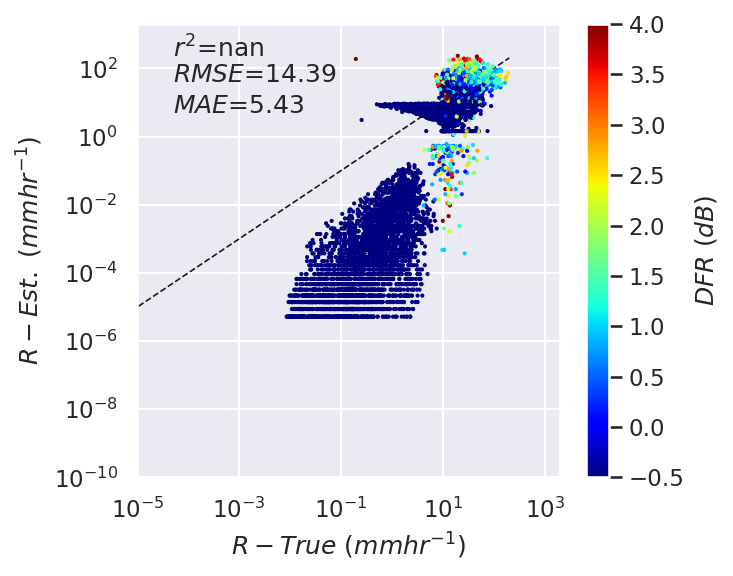

In [53]:
rmse, mae, corr1 = metrics_pd(df['r'], df['r_gpm_operational'])
print(rmse, mae, corr1)

fig, ax1 = plt.subplots(figsize=(5, 4), dpi=150)

sc1 = ax1.scatter(df.r[df['log10_nw'] > df['bringi']], 
                  df.r_gpm_operational[df['log10_nw'] > df['bringi']], 
                   c=df.dfr[df['log10_nw'] > df['bringi']], cmap='jet', vmin=-0.5, vmax=4, s=1, zorder=10)
x = np.linspace(*ax1.get_xlim())
ax1.plot(x, x, c='k', ls='--', lw=0.8)
ax1.set_ylabel(r"$R-Est. \ (mm hr^{-1}) $")
ax1.set_xlabel(r"$R -True \ (mm hr^{-1})$")
ax1.text(0.00005, 200, r"$r^2$" + f"={corr1:.2f}")
ax1.text(0.00005, 40, r"$RMSE$" + f"={rmse:.2f}")
ax1.text(0.00005, 5, r"$MAE$" + f"={mae:.2f}")
ax1.set_xlim(0.00001, 2000)
ax1.set_ylim(0.0000000001, 2000)
fig.colorbar(sc1, ax=ax1, label=r'$DFR \ (dB)$')
ax1.set_yscale('log')
ax1.set_xscale('log')
plt.tight_layout()
plt.savefig('../results/r_operational_filtered.jpeg')

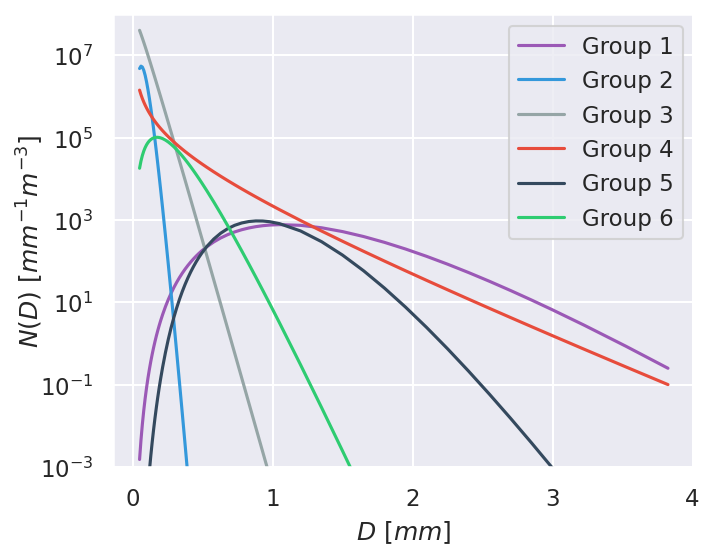

In [54]:
fig, ax1 = plt.subplots(figsize=(5,4), dpi=150)
sc = ax.scatter(df['dm'], df['log10_nw'], c=df['kmeans_6'], s=1.5, cmap=my_cmap6)
ax.set_xlabel("$D_m \ [mm]$")
ax.set_ylabel("$Log_{10}(Nw) \ [Log_{10}(mm^{1}mm^{-3})]$")

ax1.set_yscale('log')
# ax1.set_xscale('log')
ax1.set_ylim(1e-3, 1e8)
d = ds_lear.diameter/1000
ax1.grid('both')
n = df['kmeans_6'].max() + 1
ax1.set_ylabel("$N(D) \  [mm^{-1}m^{-3}]$", labelpad=-3)
ax1.set_xlabel("$D\ [mm]$")
# colors = pl.cm.jet(np.linspace(0,1,n))
for i in range(0,n):
    df_sub = df[df['kmeans_6'] == i]
    mu = df_sub['mu'].mean()
    dm = df_sub['dm'].mean()
    nw = 10 ** (df_sub['log10_nw'].mean())
    gm = norm_gamma(d, nw=nw, mu=mu, dm=dm)
    ax1.plot(ds_lear.diameter/1000, gm, c=colors6[i], label=f"Group {i + 1}")
ax1.legend()

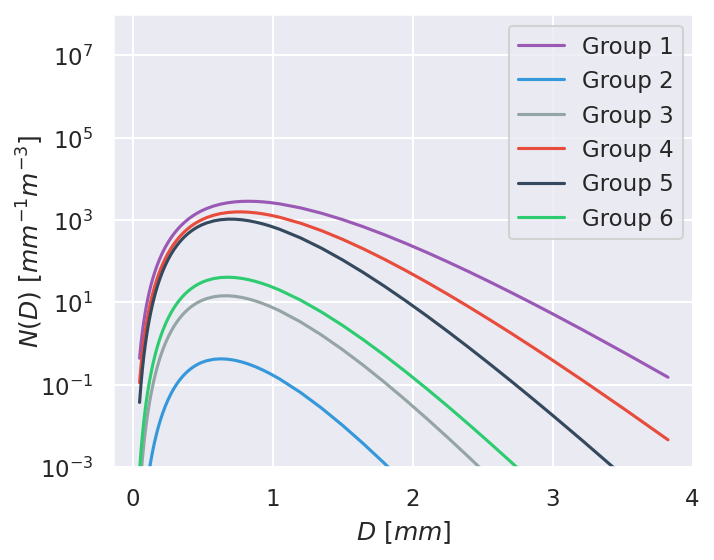

In [55]:
fig, ax1 = plt.subplots(figsize=(5,4), dpi=150)
ax1.set_yscale('log')
# ax1.set_xscale('log')

ax1.set_ylim(1e-3, 1e8)
d = ds_lear.diameter/1000
ax1.grid('both')
n = df['kmeans_6'].max() + 1
ax1.set_ylabel("$N(D) \  [mm^{-1}m^{-3}]$", labelpad=-3)
ax1.set_xlabel("$D\ [mm]$")
# colors = pl.cm.jet(np.linspace(0,1,n))
for i in range(0,n):
    df_sub = df[df['kmeans_6'] == i]
    # mu = df_sub['mu'].mean()
    # dm = df_sub['dm'].mean()
    # nw = 10 ** (df_sub['log10_nw'].mean())
    # gm = norm_gamma(d, nw=nw, mu=mu, dm=dm)
    # ax1.plot(ds_lear.diameter/1000, gm, c=colors6[i], label=f"Group {i + 1}")
    
    mu = df_sub['mu_williams'].mean()
    dm = df_sub['dm_williams'].mean()
    nw = 10 ** (df_sub['log10nw_will'].mean() / 10)
    gm = norm_gamma(d, nw=nw, mu=mu, dm=dm)
    ax1.plot(ds_lear.diameter/1000, gm, c=colors6[i], label=f"Group {i + 1}")
ax1.legend()

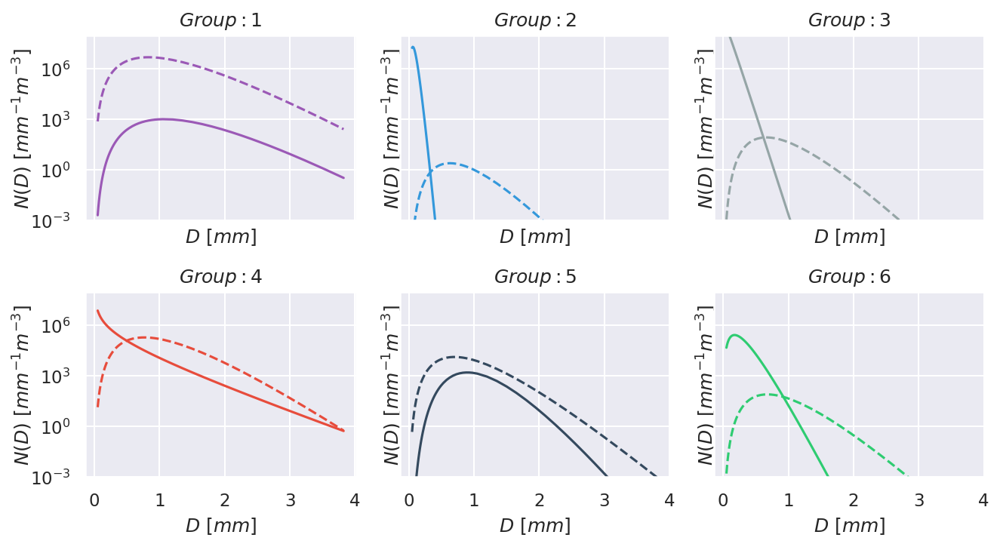

In [56]:
fig, axs = plt.subplots(2, 3, figsize=(9,5), dpi=150, sharex=True, sharey=True)

for idx, ax1 in enumerate(axs.flatten()):
    ax1.set_yscale('log')
    # ax1.set_xscale('log')
    ax1.set_ylim(1e-3, 1e8)
    d = ds_lear.diameter/1000
    ax1.grid('both')
    n = df['kmeans_6'].max() + 1
    ax1.set_ylabel("$N(D) \  [mm^{-1}m^{-3}]$", labelpad=-3)
    ax1.set_xlabel("$D\ [mm]$")
    df_sub = df[df['kmeans_6'] == idx]
    mu = df_sub['mu'].mean()
    dm = df_sub['dm'].mean()
    nw = (10 ** (df_sub['log10_nw'])).mean()
    gm = norm_gamma(d, nw=nw, mu=mu, dm=dm)
    ax1.plot(ds_lear.diameter/1000, gm, c=colors6[idx], label='K-means')
    mu = df_sub['mu_williams'].mean()
    dm = df_sub['dm_williams'].mean()
    nw = (10 ** (df_sub['log10nw_will'] / 10)).mean()
    gm = norm_gamma(d, nw=nw, mu=mu, dm=dm)
    ax1.plot(ds_lear.diameter/1000, gm, c=colors6[idx], ls='--',label='Williams et al. 2014')
    ax1.set_title(f"$Group: {idx + 1}$")
# ax1.legend()
plt.tight_layout()
# ax1.legend()

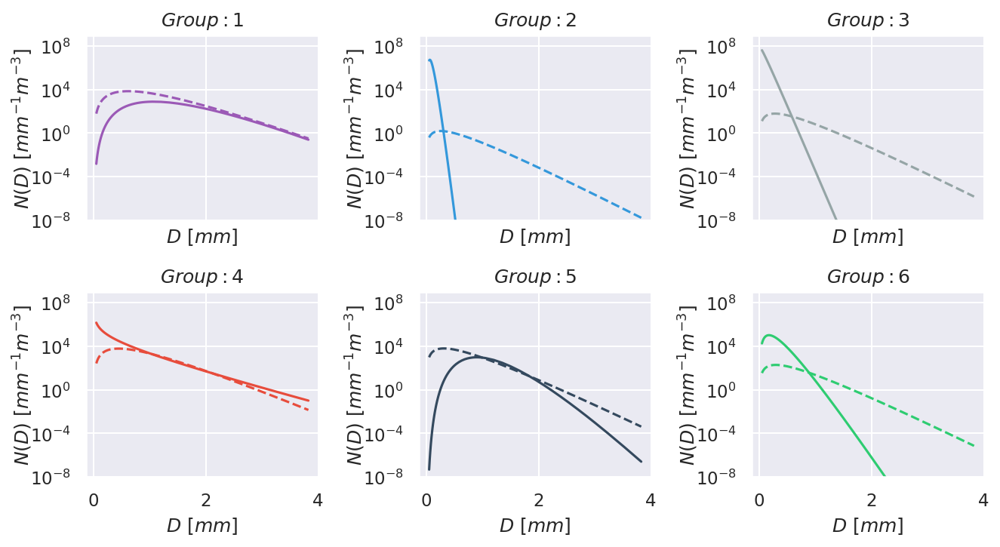

In [57]:
fig, axs = plt.subplots(2, 3, figsize=(9,5), dpi=150, sharex=True)

for idx, ax1 in enumerate(axs.flatten()):
    ax1.set_yscale('log')
    # ax1.set_xscale('log')
    ax1.set_ylim(1e-8, 1e9)
    d = ds_lear.diameter/1000
    ax1.grid('both')
    n = df['kmeans_6'].max() + 1
    ax1.set_ylabel("$N(D) \  [mm^{-1}m^{-3}]$", labelpad=-3)
    ax1.set_xlabel("$D\ [mm]$")
    df_sub = df[df['kmeans_6'] == idx]
    mu = df_sub['mu'].mean()
    dm = df_sub['dm'].mean()
    nw = 10 ** (df_sub['log10_nw'].mean())
    gm = norm_gamma(d, nw=nw, mu=mu, dm=dm)
    ax1.plot(ds_lear.diameter/1000, gm, c=colors6[idx], label='K-means')
    mu = df_sub['mu_camp'].mean()
    dm = df_sub['dm_camp'].mean()
    nw = 10 ** (df_sub['log10nw_camp'].mean() / 10)
    gm = norm_gamma(d, nw=nw, mu=mu, dm=dm)
    ax1.plot(ds_lear.diameter/1000, gm, c=colors6[idx], ls='--',label='Williams et al. 2014')
    ax1.set_title(f"$Group: {idx + 1}$")
# ax1.legend()
plt.tight_layout()
# ax1.legend()

3 0.16965971459934287 3723541.9230523575
3 1.1876247689463935 2.6423272378020726e+18


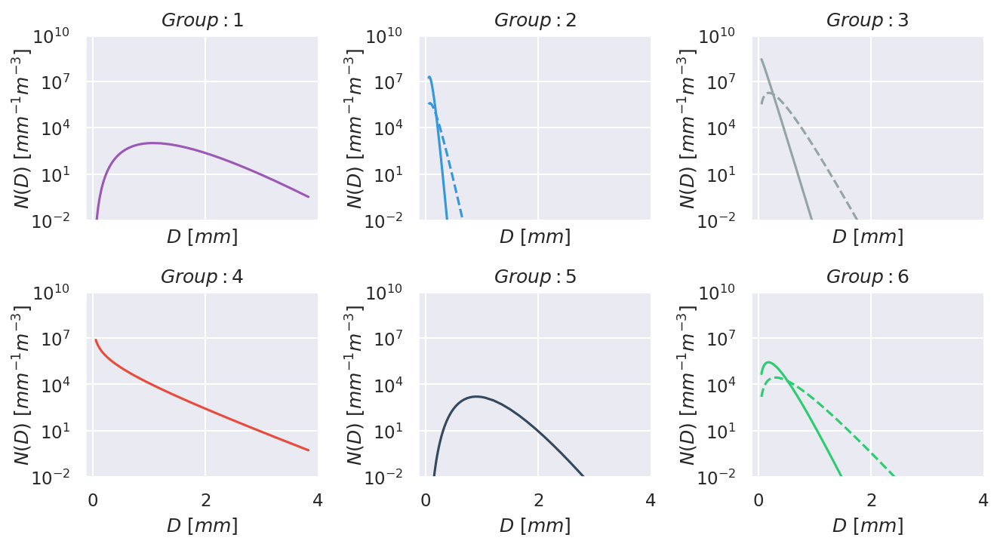

In [58]:
fig, axs = plt.subplots(2, 3, figsize=(9,5), dpi=150, sharex=True)

for idx, ax1 in enumerate(axs.flatten()):
    ax1.set_yscale('log')
    # ax1.set_xscale('log')
    ax1.set_ylim(1e-2, 1e10)
    d = ds_lear.diameter/1000
    ax1.grid('both')
    n = df['kmeans_6'].max() + 1
    ax1.set_ylabel("$N(D) \  [mm^{-1}m^{-3}]$", labelpad=-3)
    ax1.set_xlabel("$D\ [mm]$")
    df_sub = df[df['kmeans_6'] == idx]
    mu = df_sub['mu'].mean()
    dm = df_sub['dm'].mean()
    nw = (10 ** (df_sub['log10_nw'])).mean()
    gm = norm_gamma(d, nw=nw, mu=mu, dm=dm)
    ax1.plot(ds_lear.diameter/1000, gm, c=colors6[idx], label='K-means')
    mu = 3
    dm = df_sub['dm_rt_dfr_gm_mu_3'].mean()
    nw = (10 ** (df_sub['log10nw_dm_gm_mu_3']/ 10)).mean()
    gm = norm_gamma(d, nw=nw, mu=mu, dm=dm)
    if idx in [1, 4]:
        print(mu, dm, nw)
    ax1.plot(ds_lear.diameter/1000, gm, c=colors6[idx], ls='--',label='GPM Theoretical.')
    ax1.set_title(f"$Group: {idx + 1}$")
# ax1.legend()
plt.tight_layout()
# ax1.legend()